<a href="https://colab.research.google.com/github/Shane3444/dog-breed-identification/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dog Breed Identification
This is an end to end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

### 1. Problem
Identifying the breed of a dog given an image of a dog.
### 2. Data
The data is from Kaggle's Dog Breed Identification Competition.

[kaggle.com/c/dog-breed-identification/data](https://)

### 3. Evaluation
Multi-class log loss function between predicted probability and observed target.

### 4. Features
* We're dealing with images(unstructured data)
* There are 120 dog breeds (which means we have 120 classes)
* 10000+ images which are labelled
* 10000+ images which are unlabelled

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

In [ ]:
from matplotlib.pyplot import imread

In [ ]:
from keras import Sequential
from keras.layers import Dense

In [ ]:
from keras.models import load_model

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

In [ ]:
tf.__version__, hub.__version__

('2.12.0', '0.14.0')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# !unzip "/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/dog-breed-identification-dataset.zip" -d "/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/"

## Turning images to tensors(numerical format)

In [ ]:
labels_csv = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
len(labels_csv)

10222

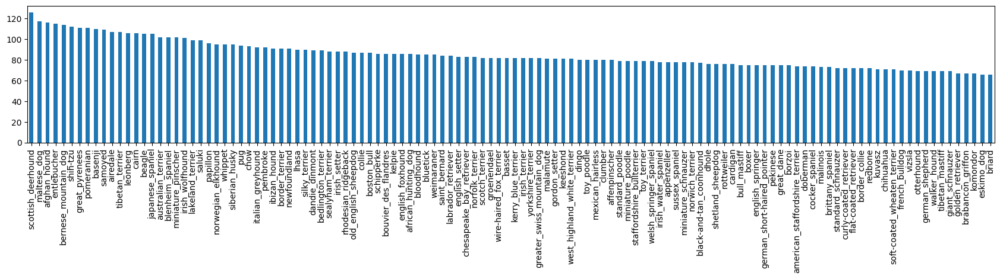

In [ ]:
labels_csv.breed.value_counts().plot(kind = "bar", figsize = (21, 3));

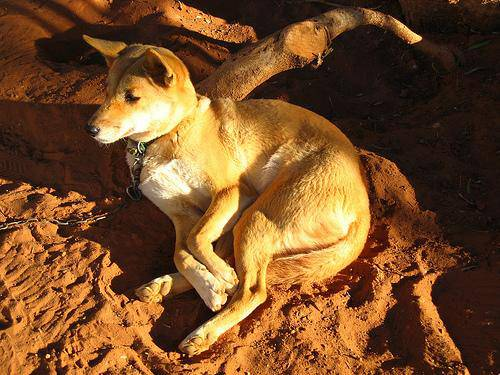

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

## Getting images and labels

In [ ]:
filenames = ["/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/" + fname + ".jpg" for fname in labels_csv.id]
filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/0042188c895a2f14ef6

In [ ]:
import os
if len(os.listdir("/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train")) == len(filenames):
  print("Proceed")
else:
  print("Mismatch")

Proceed


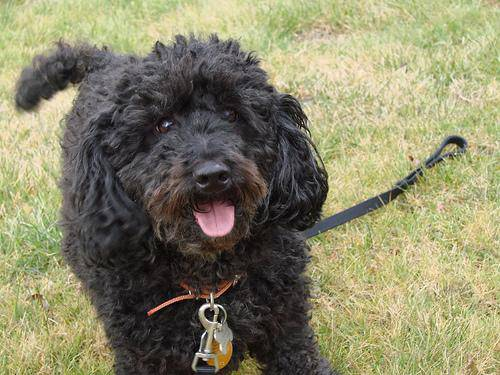

In [ ]:
Image(filenames[2300])

In [ ]:
labels = labels_csv["breed"]
labels

0                     boston_bull
1                           dingo
2                        pekinese
3                        bluetick
4                golden_retriever
                   ...           
10217                      borzoi
10218              dandie_dinmont
10219                    airedale
10220          miniature_pinscher
10221    chesapeake_bay_retriever
Name: breed, Length: 10222, dtype: object

In [ ]:
unique_labels = np.unique(labels)

In [ ]:
len(unique_labels)

120

In [ ]:
unique_labels

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
labels[0]

'boston_bull'

In [ ]:
bool_labels = [label == np.array(unique_labels) for label in labels]
len(bool_labels)

10222

In [ ]:
unique_labels[:5]

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier'], dtype=object)

In [ ]:
labels[:5]

0         boston_bull
1               dingo
2            pekinese
3            bluetick
4    golden_retriever
Name: breed, dtype: object

In [ ]:
bool_labels[:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

## Splitting into training and validation data

In [ ]:
X = filenames
y = bool_labels

In [ ]:
len(X)

10222

We'll start experimenting with ~1000 images.

In [ ]:
NUM_IMG = 1000 # @param {type:"slider", min:0, max:10000, step:1000}

In [ ]:
NUM_IMG

1000

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMG], y[:NUM_IMG], test_size=0.2, random_state = 42)

In [ ]:
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
X_train[:5]

['/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/00bee065dcec471f26394855c5c2f3de.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg']

In [ ]:
y_train[:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

## Preprocessing Images (Images to Tensors)

For preprocessing we write a function which does a few things:
1. Take an image filepath as input
2. Use Tensorflow to read the image and save it to a variable `image`
3. Turn our `image` into tensors
4. Normalise RGB Channel values
5. Resize the `image` to be the shape of (224, 224)
6. Return the modified `image`

In [ ]:
#image to np arrays
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
IMG_SIZE = 224

In [ ]:
def process_image(img_path):
  """
  Takes image filepath and converts it into a Tensor
  """
  image = tf.io.read_file(img_path)
  # converting to 3 channel tensor(RGB)
  image = tf.image.decode_jpeg(image, channels = 3)
  # normalise rgb values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize image
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

## Converting data into batches
* not possible to fit large data on memory
* batch size set to 32 to make it possible
* batch size adjustable if needed

In order to use Tensorflow, our data needs to be like `(image, label)`

In [ ]:
def get_image_label(img_path, label):
  """
  Processes the image and returns the image and associated label
  """
  image = process_image(img_path)
  return image, label

In [ ]:
get_image_label(X[0], tf.constant(y[0]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.5705322 , 0.33588538, 0.15008473],
         [0.66901225, 0.4601166 , 0.26022965],
         [0.61062384, 0.43763596, 0.21601713],
         ...,
         [0.8182312 , 0.7297958 , 0.26963907],
         [0.72454786, 0.6059109 , 0.2653059 ],
         [0.7494603 , 0.6252918 , 0.32456532]],
 
        [[0.6761415 , 0.4733761 , 0.30642927],
         [0.5672121 , 0.38192675, 0.20349538],
         [0.5883547 , 0.4322571 , 0.2403155 ],
         ...,
         [0.9326942 , 0.8260503 , 0.41093278],
         [0.86072475, 0.74250627, 0.3694122 ],
         [0.76781666, 0.6461604 , 0.29291284]],
 
        [[0.46350825, 0.29595745, 0.1536156 ],
         [0.42554107, 0.27039403, 0.12009468],
         [0.7887875 , 0.6547362 , 0.49015   ],
         ...,
         [0.89372385, 0.7696401 , 0.41811958],
         [0.88609535, 0.7585918 , 0.36495727],
         [0.8243601 , 0.69494826, 0.2930575 ]],
 
        ...,
 
        [[0.7344025 , 0.4716574 

In [ ]:
BATCH_SIZE = 32

In [ ]:
def create_batches(X, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data from image(X) and label(Y) pairs.
  Shuffles the data if it is training data.
  Also accepts input with no labels
  """
  if test_data:
    print("Creating test batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
  elif valid_data:
    print("Creating validation batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
  else:
    print("Creating training batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    data = data.shuffle(buffer_size = len(X))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
  return data_batch

In [ ]:
train_data = create_batches(X_train, y_train)
val_data = create_batches(X_val, y_val, valid_data = True)

Creating training batches...
Creating validation batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualising Data Batches

In [ ]:
import matplotlib.pyplot as plt

# create a function for visualising images in a batch
def show_25_images(images, labels):
  plt.figure(figsize = (20, 20))
  for i in range(25):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(images[i])
    plt.title(unique_labels[labels[i].argmax()])
    # plt.axis("off")

In [ ]:
unique_labels[y[0].argmax()]

'boston_bull'

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[3.74002814e-01, 3.97532254e-01, 4.58648741e-01],
          [3.15292358e-01, 3.27057064e-01, 3.85880619e-01],
          [3.14183027e-01, 3.09316069e-01, 3.69314909e-01],
          ...,
          [3.61327022e-01, 4.56660241e-01, 3.90268445e-01],
          [3.60941201e-01, 4.37693298e-01, 4.14233297e-01],
          [3.62062335e-01, 4.36572164e-01, 4.20885891e-01]],
 
         [[3.19626749e-01, 3.43199939e-01, 3.93148869e-01],
          [2.77963221e-01, 2.93649495e-01, 3.40664536e-01],
          [2.58792043e-01, 2.57535040e-01, 3.05133075e-01],
          ...,
          [3.45684499e-01, 4.43412125e-01, 3.69837075e-01],
          [3.41132700e-01, 4.23485667e-01, 3.97137702e-01],
          [3.41132700e-01, 4.23485667e-01, 4.03844237e-01]],
 
         [[3.07237983e-01, 3.34688962e-01, 3.68530005e-01],
          [2.57165611e-01, 2.75131315e-01, 3.06055635e-01],
          [2.06150755e-01, 2.07676739e-01, 2.33986884e-01],
          ...,
          [3.25898677e-01, 4.18563277e-01, 3.4674

In [ ]:
len(train_images), len(train_labels)

(32, 32)

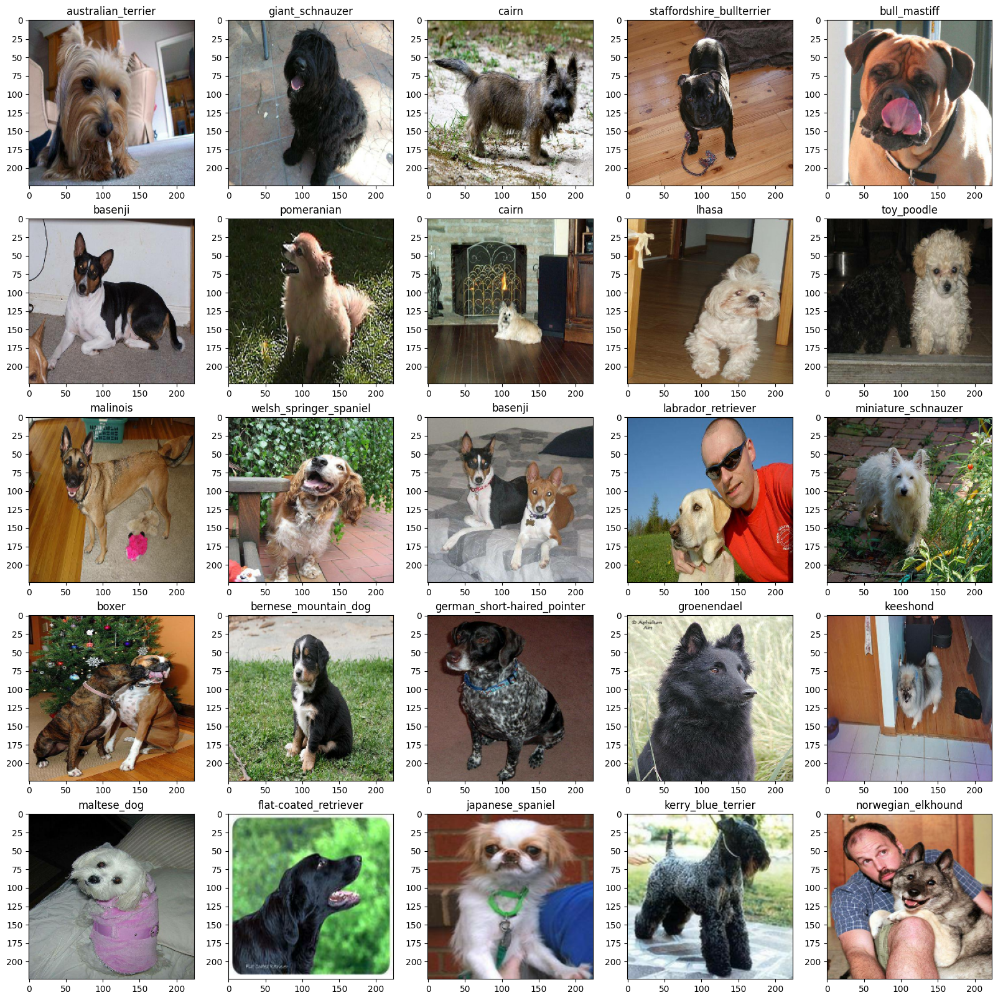

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

## Building a model
Few things to define before diving in:
* input shape
* output shape
* Model URL

In [ ]:
INPUT_SHAPE = [None, 224, 224, 3] # [batch, height, width, color_channels]
OUTPUT_SHAPE = len(unique_labels)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [ ]:
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model = MODEL_URL):
  print("Building model with: ", MODEL_URL)

  model = Sequential(layers = [
      hub.KerasLayer(MODEL_URL),
      Dense(units = OUTPUT_SHAPE,
            activation = "softmax")
  ])
  model.compile(optimizer = tf.keras.optimizers.Adam(),
                loss = tf.keras.losses.CategoricalCrossentropy(),
                metrics = ["accuracy"])
  model.build(INPUT_SHAPE)
  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_3 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_3 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

In [ ]:
# load TensorBoard extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime

# create a function to create callback function

def create_tensorboard_callback():
  logdir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Dog Vision/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)

In [ ]:
EPOCHS = 100

In [ ]:
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  model = create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x = train_data,
            epochs = EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  return model

In [ ]:
model = train_model()
# model = load_model("/content/drive/MyDrive/Colab Notebooks/Dog Vision/first_model.h5")

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 8s 167ms/step - loss: 4.6933 - accuracy: 0.0838 - val_loss: 3.5477 - val_accuracy: 0.2600
Epoch 2/100
25/25 [==============================] - 5s 191ms/step - loss: 1.6819 - accuracy: 0.6750 - val_loss: 2.2189 - val_accuracy: 0.4650
Epoch 3/100
25/25 [==============================] - 3s 122ms/step - loss: 0.5783 - accuracy: 0.9388 - val_loss: 1.7502 - val_accuracy: 0.5400
Epoch 4/100
25/25 [==============================] - 4s 181ms/step - loss: 0.2631 - accuracy: 0.9837 - val_loss: 1.5464 - val_accuracy: 0.5900
Epoch 5/100
25/25 [==============================] - 6s 228ms/step - loss: 0.1518 - accuracy: 0.9962 - val_loss: 1.4547 - val_accuracy: 0.6150
Epoch 6/100
25/25 [==============================] - 4s 148ms/step - loss: 0.1039 - accuracy: 0.9975 - val_loss: 1.3968 - val_accuracy: 0.6050
Epoch 7/100
25/25 [=============================

In [ ]:
# model.save(filepath= "/content/drive/MyDrive/Colab Notebooks/Dog Vision/first_model.h5")

In [ ]:
# !lsof -i:6006

In [ ]:
# !kill 12459
%tensorboard --logdir="/content/drive/MyDrive/Colab Notebooks/Dog Vision/logs"

Reusing TensorBoard on port 6006 (pid 8401), started 3:57:28 ago. (Use '!kill 8401' to kill it.)

<IPython.core.display.Javascript object>

## Making and evaluating predictions

In [ ]:
# make predictions on validation data (not used in training)
predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 4s 141ms/step


array([[2.29855665e-04, 1.07487955e-04, 7.68170168e-04, ...,
        1.13800750e-03, 3.09170500e-05, 2.63937260e-03],
       [3.52325093e-04, 1.95917033e-04, 5.97956218e-03, ...,
        1.29767825e-04, 5.98345790e-03, 1.62375538e-04],
       [6.27557620e-06, 2.31097820e-05, 8.67515701e-06, ...,
        1.62371316e-06, 7.44353429e-07, 1.66976068e-04],
       ...,
       [1.38624875e-06, 7.21070819e-06, 1.45367419e-04, ...,
        4.23355505e-06, 5.20525391e-05, 1.21651814e-04],
       [4.59190179e-03, 1.04238512e-04, 7.55255023e-05, ...,
        1.52593548e-05, 2.45494211e-05, 4.44985600e-03],
       [5.40171204e-05, 1.47720357e-05, 5.92302706e-04, ...,
        4.92180651e-03, 5.55450702e-03, 5.11109356e-05]], dtype=float32)

In [ ]:
(np.max(predictions[0]))

0.24902567

In [ ]:
np.argmax(predictions[0])

17

In [ ]:
unique_labels[33]

'collie'

In [ ]:
def predicted_label(predictions):
  return unique_labels[np.argmax(predictions)]

In [ ]:
predicted_label(predictions[0])

'border_terrier'

In [ ]:
# unbatching a dataset
def unbatchify(batch_data):
  images_ = []
  labels_ = []
  for image, label in batch_data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_labels[(np.argmax(label))])
  return images_, labels_

In [ ]:
val_images, val_labels = unbatchify(val_data)

In [ ]:
val_labels[0]

'cairn'

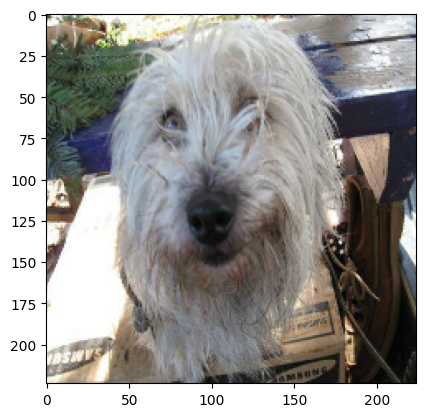

In [ ]:
plt.imshow(val_images[0])

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n = 1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  pred_label = predicted_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  plt.title(f"Predicted: {pred_label} \nProbability: {(np.max(pred_prob) * 100):2.0f}% \nTrue Label: {true_label}", color = color)

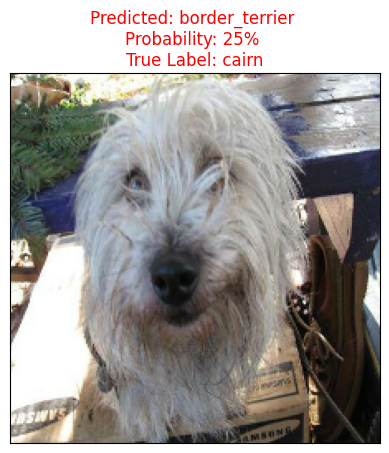

In [ ]:
plot_pred(predictions, val_labels, val_images, 0)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n = 1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label = predicted_label(pred_prob)
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_labels[top_10_pred_indexes]
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = 'red')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")

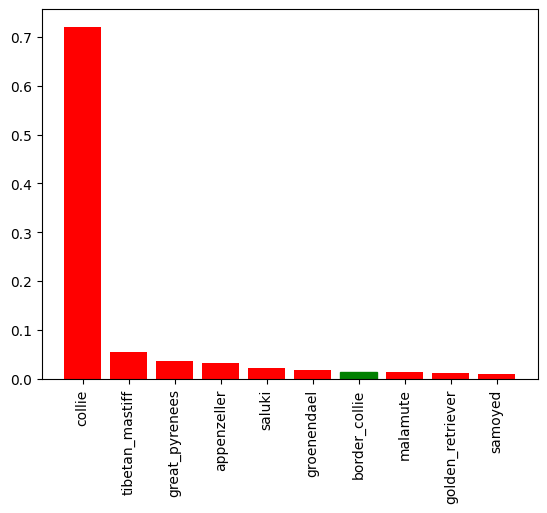

In [ ]:
plot_pred_conf(predictions, val_labels, 9)

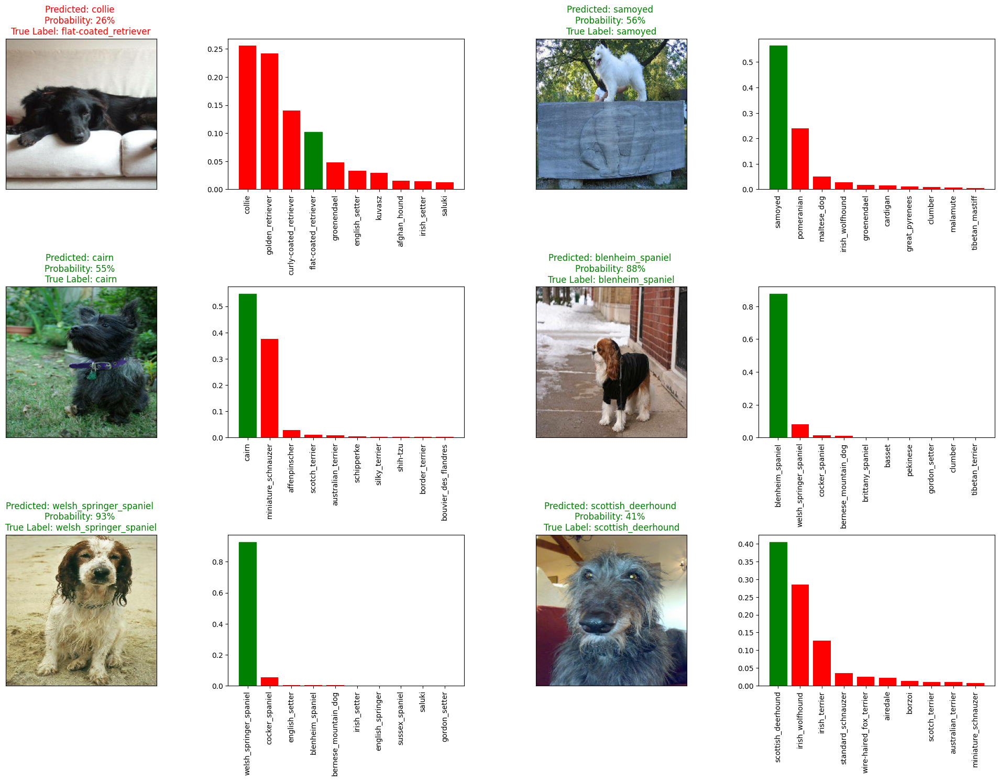

In [ ]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize = (10 * num_cols, 5* num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
  plot_pred(predictions,
            val_labels,
            val_images,
            i + i_multiplier)

  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  plot_pred_conf(predictions,
                 val_labels,
                 i + i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()

In [ ]:
def save_model(model, suffix = None):
  modeldir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  modelpath = modeldir + "_" + suffix + ".h5"
  print(f"Saving model to {modelpath} ...")
  model.save(modelpath)
  return modelpath

In [ ]:
def load_model(modelpath):
  print(f"Loading model from: {modelpath} ...")
  loaded_model = tf.keras.models.load_model(modelpath,
             custom_objects = {"KerasLayer" : hub.KerasLayer})
  return loaded_model

In [ ]:
save_model(model, suffix = "1000_images_mobilenetv2_Adam")

Saving model to /content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20230807-12461691412404_1000_images_mobilenetv2_Adam.h5 ...


'/content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20230807-12461691412404_1000_images_mobilenetv2_Adam.h5'

In [ ]:
loaded_1000_image_model = load_model("/content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20230807-12461691412404_1000_images_mobilenetv2_Adam.h5")

Loading model from: /content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20230807-12461691412404_1000_images_mobilenetv2_Adam.h5 ...


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 86ms/step - loss: 1.2402 - accuracy: 0.6450


[1.2401514053344727, 0.6449999809265137]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 138ms/step - loss: 1.2402 - accuracy: 0.6450


[1.2401514053344727, 0.6449999809265137]

## Training the model on the full dataset

In [ ]:
full_data = create_batches(X, y)

Creating training batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)
full_model.fit(x = full_data,
               epochs = EPOCHS,
               callbacks = [full_model_tensorboard,
                            full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 38s 102ms/step - loss: 1.3163 - accuracy: 0.6735
Epoch 2/100
320/320 [==============================] - 33s 103ms/step - loss: 0.3982 - accuracy: 0.8827
Epoch 3/100
320/320 [==============================] - 33s 103ms/step - loss: 0.2373 - accuracy: 0.9342
Epoch 4/100
320/320 [==============================] - 33s 103ms/step - loss: 0.1534 - accuracy: 0.9638
Epoch 5/100
320/320 [==============================] - 33s 103ms/step - loss: 0.1066 - accuracy: 0.9775
Epoch 6/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0760 - accuracy: 0.9879
Epoch 7/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0572 - accuracy: 0.9921
Epoch 8/100
320/320 [==============================] - 32s 101ms/step - loss: 0.0465 - accuracy: 0.9942
Epoch 9/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0369 - accuracy: 0.9959
Epoch 10/100
320/320 [==============================] - 33s 101m

In [ ]:
save_model(full_model, suffix = "full_imageset_mobilenetv2_Adam")

Saving model to /content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20230807-12591691413143_full_imageset_mobilenetv2_Adam.h5 ...


'/content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20230807-12591691413143_full_imageset_mobilenetv2_Adam.h5'

In [ ]:
loaded_full_model = load_model("/content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20230807-12591691413143_full_imageset_mobilenetv2_Adam.h5")

Loading model from: /content/drive/MyDrive/Colab Notebooks/Dog Vision/models/20230807-12591691413143_full_imageset_mobilenetv2_Adam.h5 ...


## Make predictions on test data
1. get test image filenames
2. create filenames and labels into batches
3. make predictions

In [ ]:
test_path = "/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = create_batches(test_filenames, test_data = True)

Creating test batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions = loaded_full_model.predict(test_data, verbose = 1)

324/324 [==============================] - 33s 101ms/step


In [ ]:
np.savetxt("/content/drive/MyDrive/Colab Notebooks/Dog Vision/preds_array.csv", test_predictions, delimiter = ",")

In [ ]:
test_predictions = np.loadtxt("/content/drive/MyDrive/Colab Notebooks/Dog Vision/preds_array.csv", delimiter = ",")

In [ ]:
test_predictions.shape

(10357, 120)

In [ ]:
ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [ ]:
preds_df = pd.DataFrame(columns = ["id"] + list(unique_labels))

In [ ]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
preds_df["id"] = ids

In [ ]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dfefaa03faeab447d6b48e7367255b43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e4ba350279796ff15c3a634037a6f88e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dfe03aa0ae066e09cdda6e7f6e08390a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e73d52671c56e1507fed58c4c287d5f1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e0072c3d9bee718b68ff1cf964a52536,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,0910c194c44f79721d282c8416016dab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,07b9276c1a3b39979d0f75027fb10dc6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,088463756041ddbc5f9b905b6ed9a940,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,0917cea14ed14bb43c7ca5ead4f38266,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(unique_labels)] = test_predictions
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dfefaa03faeab447d6b48e7367255b43,2.772751e-07,1.022231e-11,4.378429e-11,1.192383e-09,4.226331e-13,1.305776e-11,3.871017e-11,3.661454e-12,1.105922e-10,...,8.427743e-10,6.852031e-11,8.424759e-09,3.103821e-05,5.328311e-11,5.179155e-14,8.699386e-13,9.998355e-01,5.972465e-09,2.247618e-15
1,e4ba350279796ff15c3a634037a6f88e,5.509397e-13,5.535869e-09,5.152486e-06,5.805880e-09,4.557362e-07,1.841989e-08,3.488051e-05,5.156804e-11,3.240147e-10,...,1.444985e-06,2.875814e-12,1.053150e-07,3.353145e-08,5.043349e-10,1.279018e-04,7.744807e-08,1.910521e-06,3.018022e-04,1.699644e-08
2,dfe03aa0ae066e09cdda6e7f6e08390a,7.164268e-10,1.051625e-09,4.305275e-08,4.424843e-11,4.100700e-08,2.068200e-09,1.796455e-09,1.005005e-11,3.465826e-11,...,6.591302e-10,4.741110e-11,6.144616e-09,1.170092e-10,5.651491e-10,1.517768e-07,3.937240e-08,1.027289e-10,1.327355e-08,2.719934e-10
3,e73d52671c56e1507fed58c4c287d5f1,4.301759e-10,9.397791e-13,4.837562e-08,7.865077e-11,2.483011e-08,1.268481e-09,1.304492e-09,7.463715e-10,1.190816e-10,...,7.853876e-08,9.827860e-09,3.100612e-09,3.105583e-13,9.311692e-11,1.475966e-09,6.640268e-09,4.261693e-10,7.536557e-10,2.932204e-09
4,e0072c3d9bee718b68ff1cf964a52536,4.082478e-09,3.046866e-08,1.562505e-11,5.146549e-06,8.851378e-12,2.292874e-08,1.604409e-07,1.865459e-08,2.125725e-06,...,1.160179e-10,8.094318e-12,1.113945e-10,9.952363e-01,6.361012e-09,7.954450e-11,1.647388e-10,4.627120e-04,2.209129e-10,8.731731e-13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,0910c194c44f79721d282c8416016dab,3.327140e-06,9.121808e-05,5.172841e-08,5.542061e-09,8.322396e-09,1.568741e-06,7.623822e-11,1.002620e-06,4.270505e-05,...,9.682198e-07,2.103569e-09,1.025481e-05,5.830043e-03,1.012940e-02,6.558826e-04,5.568723e-06,4.671440e-06,3.847956e-07,4.756829e-05
10353,07b9276c1a3b39979d0f75027fb10dc6,2.997871e-10,9.915382e-01,3.915233e-12,1.830468e-11,3.158020e-08,4.597336e-09,3.083942e-11,3.435800e-07,2.282552e-11,...,9.057535e-12,5.423726e-09,5.761035e-11,2.024156e-09,2.468985e-07,4.813651e-12,4.719316e-11,1.954374e-12,5.001416e-12,3.669724e-12
10354,088463756041ddbc5f9b905b6ed9a940,3.107529e-12,4.356561e-11,9.305218e-14,4.447556e-11,1.438251e-10,9.999936e-01,2.634703e-11,5.797861e-12,8.787588e-09,...,1.411788e-12,9.712270e-13,1.824988e-11,1.217868e-09,1.386991e-11,1.092349e-12,3.222973e-12,1.540386e-11,3.032085e-11,1.709694e-13
10355,0917cea14ed14bb43c7ca5ead4f38266,1.079554e-08,4.207756e-06,4.353238e-07,1.092959e-07,1.251946e-04,1.130603e-07,2.111292e-04,1.940224e-03,4.733523e-07,...,4.706695e-05,7.279808e-06,2.232739e-08,2.788200e-06,1.840179e-07,1.409194e-09,1.973408e-07,4.413802e-08,2.391376e-04,3.408323e-07


In [ ]:
preds_df.to_csv("/content/drive/MyDrive/Colab Notebooks/Dog Vision/full_model_predictions.csv",
                index = False)

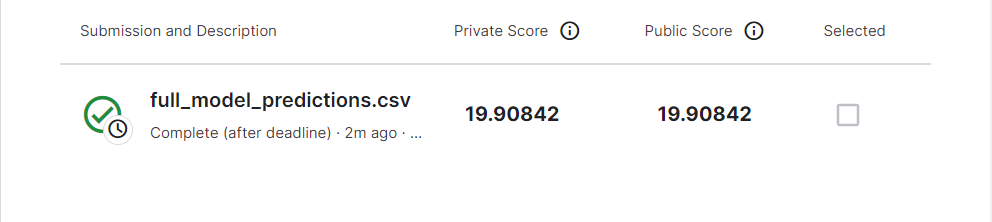

## Making predictions on custom images

In [ ]:
custom_path = "/content/drive/MyDrive/Colab Notebooks/Dog Vision/data/custom-data/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_data = create_batches(custom_image_paths, test_data = True)

Creating test batches...


In [ ]:
custom_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [ ]:
custom_pred_labels = [predicted_label(custom_preds[i]) for i in range(len(custom_preds))]

In [ ]:
custom_pred_labels

['german_shepherd', 'siberian_husky', 'irish_wolfhound']

In [ ]:
def plot_custom_data(custom_data, custom_pred_labels):
  custom_images = []
  for image in custom_data.unbatch().as_numpy_iterator():
    custom_images.append(image)

  plt.figure(figsize = (10, 10))
  for i, image in enumerate(custom_images):
    plt.subplot(1, 3, i + 1)
    plt.xticks([])
    plt.yticks([])
    plt.title(custom_pred_labels[i])
    plt.imshow(image)

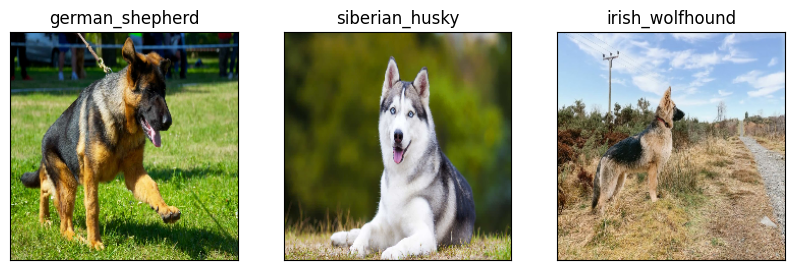

In [ ]:
plot_custom_data(custom_data, custom_pred_labels)